# Consensus Mouse: Clustering and Annotations

The Whole Mouse Brain (WMB) Consensus taxonomy is built upon two publicly released transcriptionally defined WMB taxonomies: one derived from single-cell RNA sequencing (scRNA-seq) data and the other from single-nucleus RNA sequencing (snRNA-seq) data. The Allen Institute for Brain Science (AIBS) taxonomy, based on over 4 million scRNA-seq profiles, defines 5,322 clusters organized hierarchically into 34 classes, 338 subclasses, and 1,201 supertypes. This previous AIBS release can be found [here](https://alleninstitute.github.io/abc_atlas_access/descriptions/WMB_dataset.html). In parallel, the Broad Institute taxonomy, constructed from 4.4 million snRNA-seq profiles, defines 16 classes, 223 metaclusters, and 5,030 clusters. Integrating these two large-scale taxonomies into a unified framework represents a natural and impactful next step, enabling a consensus view of cell types across the entire mouse brain and benefiting the broader neuroscience community. 

To generate this consensus taxonomy, we applied the AIBS pipeline Quality Control (QC) and post-integration QC, retaining 7,651,713 cells and nuclei. Integration of scRNA-seq and snRNA-seq data was performed using scVI, with subsampling by original clusters to mitigate sampling imbalance across cell types and brain regions, followed by projection of remaining cells into the integrated latent space. The same iterative clustering strategy employed in the AIBS taxonomy was applied at multiple hierarchical levels—global, 9 neighborhoods, and 8 finer groups. The resulting enriched taxonomy comprises 40 classes, 411 subclasses, 1,753 supertypes, and 6,756 clusters, all arranged hierarchically. A comprehensive cell type annotation table accompanies the taxonomy, including hierarchical membership, anatomical localization, neurotransmitter identity, marker genes, transcription factors, and neuropeptides. All associated metadata are publicly available as an AWS Public Dataset hosted on AWS S3 and through the Allen Brain Cell Atlass Access (abc_atlas_access) package.

Below we explore this taxonomy and combine it with cell and other metadata, visualizing the data in a 2d spatial projection and summary statistics.

In [1]:
import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple, Optional

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache

We will interact with the data using the **AbcProjectCache**. This cache object downloads data requested by the user, tracks which files have already been downloaded to your local system, and serves the path to the requested data on disk. For metadata, the cache can also directly serve up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing it if it has not already been.

**Change the download_base variable to where you would like to download the data in your system.**

In [6]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base,
    s3_bucket='allen-brain-cell-atlas-staging',
    auth_required=True
)

abc_cache.current_manifest

/Users/chris.morrison/src/abc_atlas_access/src/abc_atlas_access/abc_atlas_cache/cloud_cache.py:697: OutdatedManifestWarning: You are loading
releases/20251031/manifest.json
which is newer than the most recent manifest file you have previously been working with
releases/20250930/manifest.json
It is possible that some data files have changed between these two data releases, which will force you to re-download those data files (currently downloaded files will not be overwritten). To continue using releases/20250930/manifest.json, run
type.load_manifest('releases/20250930/manifest.json')
  warnings.warn(msg, OutdatedManifestWarning)


'releases/20251031/manifest.json'

In [7]:
abc_cache.list_manifest_file_names

['releases/20250531/manifest.json',
 'releases/20250630/manifest.json',
 'releases/20250930/manifest.json',
 'releases/20251031/manifest.json']

## Data overview

Below we list the files available with the Consensus Mouse data release. There are three main packages: Consensus-Mouse-WMB-10X, Consensus-Mouse-Macosko-10X, and Consensus-Mouse-taxonomy.

For the Consensus-Mouse-WMB-10X there are no new expression matrices, all gene expression is the same as the previous WMB release and we reuses those files, see the [gene expression tutorial]() for more details. This release does provide updated cell metadata as the while there is significant overlap between the previous WMB and Consensus releases, there are a fraction of cells in this metadata that are not in the previous release and vice versa. Below we list the available metadata files for WMB in the consensus release. 

In [8]:
print("Consensus-Mouse-WMB-10X: gene expression data (h5ad)\n\t",
      abc_cache.list_metadata_files(directory='Consensus-Mouse-WMB-10X'))

Consensus-Mouse-WMB-10X: gene expression data (h5ad)
	 ['cell_metadata', 'donor', 'library', 'value_sets']


Next we list the available expression matrix and metadata files in the Macosko directories. The expression matrices are divided similar to those in the WMB release, that is by corse brain region. The metadata are similarly structured to those in the WMB portion of the data listed above.

In [9]:
print("Consensus-Mouse-Macosko-10X: gene expression data (h5ad)\n\t",
      abc_cache.list_expression_matrix_files(directory='Consensus-Mouse-Macosko-10X'))
print("Consensus-Mouse-Macosko-10X: gene expression data (h5ad)\n\t",
      abc_cache.list_metadata_files(directory='Consensus-Mouse-Macosko-10X'))

Consensus-Mouse-Macosko-10X: gene expression data (h5ad)
	 ['Macosko-10X-CB/log2', 'Macosko-10X-CB/raw', 'Macosko-10X-HPF/log2', 'Macosko-10X-HPF/raw', 'Macosko-10X-HY/log2', 'Macosko-10X-HY/raw', 'Macosko-10X-Isocortex/log2', 'Macosko-10X-Isocortex/raw', 'Macosko-10X-MB/log2', 'Macosko-10X-MB/raw', 'Macosko-10X-MY-Pons-BS/log2', 'Macosko-10X-MY-Pons-BS/raw', 'Macosko-10X-OLF/log2', 'Macosko-10X-OLF/raw', 'Macosko-10X-PAL/log2', 'Macosko-10X-PAL/raw', 'Macosko-10X-STR/log2', 'Macosko-10X-STR/raw', 'Macosko-10X-TH/log2', 'Macosko-10X-TH/raw']
Consensus-Mouse-Macosko-10X: gene expression data (h5ad)
	 ['cell_metadata', 'donor', 'gene', 'library', 'value_sets']


Finally, we list the metadata files that make up the consensus taxonomy. We'll show how to join the taxonomy with the cell metadata files listed above later in this notebook.

In [10]:
print("Consensus-Mouse-taxonomy: metadata (csv)\n\t", abc_cache.list_metadata_files(directory='Consensus-Mouse-taxonomy'))

Consensus-Mouse-taxonomy: metadata (csv)
	 ['cell_2d_embedding_coordinates', 'cell_to_cluster_membership', 'cluster', 'cluster_annotation_term', 'cluster_annotation_term_set', 'cluster_to_cluster_annotation_membership']


### Cell metadata

Below we load the metadata for each cell in both the Macosko and WMB (AIT21) portion of the data. These contain base information of the cell's ID, it's barcode and barcoded_cell_sample (if available), the library the cell comes from and two columns defining which h5ad file a given cell's gene expression is located.

Below we load both the Macosko and WMB cell data.

In [11]:
macosko_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-Macosko-10X',
    file_name='cell_metadata',
    dtype={'cell_label': str}
).set_index('cell_label')
print("Number of cells = ", len(macosko_cell_metadata))
macosko_cell_metadata.head()

cell_metadata.csv: 100%|██████████| 514M/514M [01:25<00:00, 6.00MMB/s]    


Number of cells =  3736281


,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label
cell_label,,,,,
pBICCNsMMrBSL1aiM007d190529_ACTTCCGGTGGTCCCA,ACTTCCGGTGGTCCCA,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_AACCTTTGTTAAGTCC,AACCTTTGTTAAGTCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_TTTCCTCTCACCGGTG,TTTCCTCTCACCGGTG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_CACACAACATCATCCC,CACACAACATCATCCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS
pBICCNsMMrBSL1aiM007d190529_ACTATCTCAGTTAAAG,ACTATCTCAGTTAAAG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS


In [12]:
wmb_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-WMB-10X',
    file_name='cell_metadata',
    dtype={'cell_label': str}
).set_index('cell_label')
print("Number of cells = ", len(wmb_cell_metadata))
wmb_cell_metadata.head()

cell_metadata.csv: 100%|██████████| 375M/375M [00:57<00:00, 6.49MMB/s]    


Number of cells =  3915432


,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label
cell_label,,,,,
GCGAGAAGTTAAGGGC-410_B05,GCGAGAAGTTAAGGGC,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF
AATGGCTCAGCTCCTT-411_B06,AATGGCTCAGCTCCTT,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF
AACACACGTTGCTTGA-410_B05,AACACACGTTGCTTGA,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF
CACAGATAGAGGCGGA-410_A05,CACAGATAGAGGCGGA,410_A05,L8TX_201029_01_A10,WMB-10Xv3,WMB-10Xv3-HPF
GATCGTATCGAATCCA-411_B06,GATCGTATCGAATCCA,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF


We can use pandas `groupby` function to see how many unique items are associated for each field and list them out if the number of unique items is small.

In [13]:
def print_column_info(df):
    
    for c in df.columns:
        grouped = df[[c]].groupby(c).count()
        members = ''
        if len(grouped) < 30:
            members = str(list(grouped.index))
        print("Number of unique %s = %d %s" % (c, len(grouped), members))

In [14]:
print_column_info(pd.concat([wmb_cell_metadata, macosko_cell_metadata]))

Number of unique cell_barcode = 3580247 
Number of unique barcoded_cell_sample_label = 781 
Number of unique library_label = 1434 
Number of unique dataset_label = 3 ['Consensus-Mouse-Macosko-10X', 'WMB-10Xv2', 'WMB-10Xv3']
Number of unique feature_matrix_label = 33 


### Library and Donor metadata

Next we load metadata associated with each dataset's libraries and donors.

Below we load the library metadata. The primary information we'll be using from these tables are the parcellation the sample originated from and the id of the donor the library came from.

In [15]:
macosko_library = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-Macosko-10X',
    file_name='library'
).set_index('library_label')
macosko_library.head()

library.csv: 100%|██████████| 26.8k/26.8k [00:00<00:00, 166kMB/s] 


,region_of_interest_acronym,parcellation_term_symbol,donor_label
library_label,,,
pBICCNsMMrACAiF019d210630A1,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A2,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A3,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A4,ACA,Isocortex,F019
pBICCNsMMrACAiF019d210630A5,ACA,Isocortex,F019


In [16]:
wmb_library = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-WMB-10X',
    file_name='library'
).set_index('library_label')
wmb_library.head()

library.csv: 100%|██████████| 58.2k/58.2k [00:00<00:00, 502kMB/s]


,library_method,alignment_id,region_of_interest_acronym,parcellation_term_symbol,donor_label
library_label,,,,,
L8TX_171026_01_A04,10Xv2,1186619234,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352353
L8TX_171026_01_A05,10Xv2,1178482616,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352356
L8TX_171026_01_B04,10Xv2,1178483191,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352353
L8TX_171026_01_B05,10Xv2,1178482921,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352356
L8TX_171026_01_C05,10Xv2,1186619314,MOp,Isocortex,Snap25-IRES2-Cre;Ai14-352357


Finally, we'll load the donor metadata, this provides a formalized column of where the sample originated (Macosko or WMB/AIT21) and the sex of the donor. For the WMB data, we have additional information on the age of the donor at death.

In [17]:
macosko_donor = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-Macosko-10X',
    file_name='donor'
).set_index('donor_label')
macosko_donor.head()

donor.csv:   0%|          | 0.00/1.07k [00:00<?, ?MB/s]

donor.csv: 100%|██████████| 1.07k/1.07k [00:00<00:00, 10.6kMB/s]


,donor_sex,origin_dataset
donor_label,,
1F1,Female,Macosko
1F3,Female,Macosko
1F5,Female,Macosko
1F6,Female,Macosko
1M1,Male,Macosko


In [18]:
wmb_donor = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-WMB-10X',
    file_name='donor'
).set_index('donor_label')
wmb_donor.head()

donor.csv: 100%|██████████| 15.6k/15.6k [00:00<00:00, 112kMB/s] 


,donor_sex,donor_age,origin_dataset
donor_label,,,
Gad2-IRES-Cre;Ai14-529270,Male,61 days,AIT21
Gad2-IRES-Cre;Ai14-529271,Male,66 days,AIT21
Gad2-IRES-Cre;Ai14-529272,Female,62 days,AIT21
Gad2-IRES-Cre;Ai14-529273,Female,66 days,AIT21
Gad2-IRES-Cre;Ai14-558836,Male,56 days,AIT21


Now that we've loaded the addition metadata, we'll join them into the cell metadata tables on the library and donor label.

In [19]:
macosko_cell_extended = macosko_cell_metadata.join(macosko_library, on='library_label')
macosko_cell_extended = macosko_cell_extended.join(macosko_donor, on='donor_label')
wmb_cell_extended = wmb_cell_metadata.join(wmb_library, on='library_label')
wmb_cell_extended = wmb_cell_extended.join(wmb_donor, on='donor_label')

Below we compute statistics using pandas groupby funcationality to count the number of cells in either of the two datasets, AIT21(WMB) and Macosko. The we show the breakdown of cell count by parcellation region.

In [20]:
pd.concat([wmb_cell_extended, macosko_cell_extended]).groupby('origin_dataset')[['cell_barcode']].count()

,cell_barcode
origin_dataset,
AIT21,3915432
Macosko,3736281


In [21]:
pd.concat([wmb_cell_extended, macosko_cell_extended]).groupby('parcellation_term_symbol')[['cell_barcode']].count()

,cell_barcode
parcellation_term_symbol,
BS,583872
CB,645731
CTXsp,119786
HPF,704031
HY,347613
Isocortex,2125008
MB,974404
MY,256504
OLF,433855


### Adding color and feature order

In anticipation of plotting these cells and their metadata, we'll load a lookup table that maps values in each of our loaded tables to color, ontological ordering, and (if available) external identifiers that represent these data.

In [22]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-WMB-10X',
    file_name='value_sets'
).set_index('label')
value_sets

value_sets.csv: 100%|██████████| 1.66k/1.66k [00:00<00:00, 14.5kMB/s]


,field,table,description,order,external_identifier,parent_label,color_hex_triplet,comment
label,,,,,,,,
Female,donor_sex,donor,Female,1,NaN,NaN,#565353,NaN
Male,donor_sex,donor,Male,2,NaN,NaN,#ADC4C3,NaN
AIT21,origin_dataset,donor,WMB,1,NaN,NaN,#1f77b4,NaN
Macosko,origin_dataset,donor,Macosko,2,NaN,NaN,#ff7f0e,NaN
Isocortex,parcellation_term_symbol,library,Isocortex,1,MBA:315,NaN,#70FF71,division
SSp,parcellation_term_symbol,library,Primary somatosensory area,2,MBA:322,Isocortex,#188064,NaN
VISp,parcellation_term_symbol,library,Primary visual area,3,MBA:385,Isocortex,#08858C,structure
OLF,parcellation_term_symbol,library,Olfactory areas,4,MBA:698,NaN,#9AD2BD,division
COA,parcellation_term_symbol,library,Cortical amygdalar area,5,MBA:631,OLF,#61E7B7,NaN


The convenience function below, extracts the color and order information and adds it to our DataFrames.

In [23]:
def extract_value_set(cell_metadata_df: pd.DataFrame, input_value_set: pd.DataFrame, input_value_set_label: str):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    cell_metadata_df[f'{input_value_set_label}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['color_hex_triplet'].values
    cell_metadata_df[f'{input_value_set_label}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['order'].values

In [24]:
# Add region of interest color and order
extract_value_set(macosko_cell_extended, value_sets, 'origin_dataset')
# Add species common name color and order
extract_value_set(macosko_cell_extended, value_sets, 'donor_sex')
# Add species scientific name color and order
extract_value_set(macosko_cell_extended, value_sets, 'parcellation_term_symbol')
macosko_cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,region_of_interest_acronym,parcellation_term_symbol,donor_label,donor_sex,origin_dataset,origin_dataset_color,origin_dataset_order,donor_sex_color,donor_sex_order,parcellation_term_symbol_color,parcellation_term_symbol_order
cell_label,,,,,,,,,,,,,,,,
pBICCNsMMrBSL1aiM007d190529_ACTTCCGGTGGTCCCA,ACTTCCGGTGGTCCCA,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,BS,M007,Male,Macosko,#ff7f0e,2,#ADC4C3,2,#FF7080,11
pBICCNsMMrBSL1aiM007d190529_AACCTTTGTTAAGTCC,AACCTTTGTTAAGTCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,BS,M007,Male,Macosko,#ff7f0e,2,#ADC4C3,2,#FF7080,11
pBICCNsMMrBSL1aiM007d190529_TTTCCTCTCACCGGTG,TTTCCTCTCACCGGTG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,BS,M007,Male,Macosko,#ff7f0e,2,#ADC4C3,2,#FF7080,11
pBICCNsMMrBSL1aiM007d190529_CACACAACATCATCCC,CACACAACATCATCCC,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,BS,M007,Male,Macosko,#ff7f0e,2,#ADC4C3,2,#FF7080,11
pBICCNsMMrBSL1aiM007d190529_ACTATCTCAGTTAAAG,ACTATCTCAGTTAAAG,NaN,pBICCNsMMrBSL1aiM007d190529,Consensus-Mouse-Macosko-10X,Macosko-10X-MY-Pons-BS,BS,BS,M007,Male,Macosko,#ff7f0e,2,#ADC4C3,2,#FF7080,11


In [25]:
# Add region of interest color and order
extract_value_set(wmb_cell_extended, value_sets, 'origin_dataset')
# Add species common name color and order
extract_value_set(wmb_cell_extended, value_sets, 'donor_sex')
# Add species scientific name color and order
extract_value_set(wmb_cell_extended, value_sets, 'parcellation_term_symbol')
wmb_cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,library_method,alignment_id,region_of_interest_acronym,parcellation_term_symbol,donor_label,donor_sex,donor_age,origin_dataset,origin_dataset_color,origin_dataset_order,donor_sex_color,donor_sex_order,parcellation_term_symbol_color,parcellation_term_symbol_order
cell_label,,,,,,,,,,,,,,,,,,,
GCGAGAAGTTAAGGGC-410_B05,GCGAGAAGTTAAGGGC,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903638,RHP,HPF,Snap25-IRES2-Cre;Ai14-550850,Female,53 days,AIT21,#1f77b4,1,#565353,1,#7ED04B,6
AATGGCTCAGCTCCTT-411_B06,AATGGCTCAGCTCCTT,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903464,RHP,HPF,Snap25-IRES2-Cre;Ai14-550851,Female,53 days,AIT21,#1f77b4,1,#565353,1,#7ED04B,6
AACACACGTTGCTTGA-410_B05,AACACACGTTGCTTGA,410_B05,L8TX_201030_01_C12,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903638,RHP,HPF,Snap25-IRES2-Cre;Ai14-550850,Female,53 days,AIT21,#1f77b4,1,#565353,1,#7ED04B,6
CACAGATAGAGGCGGA-410_A05,CACAGATAGAGGCGGA,410_A05,L8TX_201029_01_A10,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903446,RHP,HPF,Snap25-IRES2-Cre;Ai14-550850,Female,53 days,AIT21,#1f77b4,1,#565353,1,#7ED04B,6
GATCGTATCGAATCCA-411_B06,GATCGTATCGAATCCA,411_B06,L8TX_201029_01_E10,WMB-10Xv3,WMB-10Xv3-HPF,10Xv3,1177903464,RHP,HPF,Snap25-IRES2-Cre;Ai14-550851,Female,53 days,AIT21,#1f77b4,1,#565353,1,#7ED04B,6


### UMAP spatial embedding

Now that we have metadata with color information, we can utilize the available Uniform Mapping Approximation and Projection (UMAP) available for this consensus mouse release to visualize the information.

Below we load the projection and join it into a combined set of AIT21/WMB and Macosko, cell metadata.

In [26]:
cell_2d_embedding_coordinates = value_sets = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-taxonomy',
    file_name='cell_2d_embedding_coordinates'
).set_index('cell_label')
cell_2d_embedding_coordinates.head()

cell_2d_embedding_coordinates.csv: 100%|██████████| 419M/419M [01:14<00:00, 5.62MMB/s]    


,x,y
cell_label,,
GACTGCGAGCTGCAAG-020_C01,-2.944492,-4.553958
CGATGTAGTGCTAGCC-021_D01,-2.963734,-4.382552
CACATAGCATGGTTGT-020_D01,-2.990784,-4.497069
CCTAAAGGTGACCAAG-020_C01,-2.944394,-4.593002
CGGAGCTAGCTTTGGT-021_D01,-2.966569,-4.598011


In [27]:
cell_extended = pd.concat([wmb_cell_extended, macosko_cell_extended]).join(cell_2d_embedding_coordinates, how='inner')
cell_extended = cell_extended.sample(frac=1)

del cell_2d_embedding_coordinates

We define a small helper function *plot_umap* to visualize the cells on the UMAP. In the examples below we will plot associated cell information colorized by dissection donor species, sex, and region of interest.

In [28]:
def plot_umap(
    xx: np.ndarray,
    yy: np.ndarray,
    cc: np.ndarray = None,
    val: np.ndarray = None,
    fig_width: float = 8,
    fig_height: float = 8,
    cmap: Optional[plt.Colormap] = None,
    labels: np.ndarray = None,
    term_orders: np.ndarray = None,
    colorbar: bool = False,
    sizes: np.ndarray = None
 ) -> Tuple[plt.Figure, plt.Axes]:
    """
    Plot a scatter plot of the UMAP coordinates.

    Parameters
    ----------
    xx : array-like
        x-coordinates of the points to plot.
    yy : array-like
        y-coordinates of the points to plot.
    cc : array-like, optional
        colors of the points to plot. If None, the points will be colored by the values in `val`.
    val : array-like, optional
        values of the points to plot. If None, the points will be colored by the values in `cc`.
    fig_width : float, optional
        width of the figure in inches. Default is 8.
    fig_height : float, optional
        height of the figure in inches. Default is 8.
    cmap : str, optional
        colormap to use for coloring the points. If None, the points will be colored by the values in `cc`.
    labels : array-like, optional
        labels for the points to plot. If None, no labels will be added to the plot.
    term_orders : array-like, optional
        order of the labels for the legend. If None, the labels will be ordered by their appearance in `labels`.
    colorbar : bool, optional
        whether to add a colorbar to the plot. Default is False.
    sizes : array-like, optional
        sizes of the points to plot. If None, all points will have the same size.
    """
    if sizes is None:
        sizes = 1
    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    if cmap is not None:
        scatt = ax.scatter(xx, yy, c=val, s=0.5, marker='.', cmap=cmap, alpha=sizes)
    elif cc is not None:
        scatt = ax.scatter(xx, yy, c=cc, s=0.5, marker='.', alpha=sizes)

    if labels is not None:
        from matplotlib.patches import Rectangle
        unique_label_colors = (labels + ',' + cc).unique()
        unique_labels = np.array([label_color.split(',')[0] for label_color in unique_label_colors])
        unique_colors = np.array([label_color.split(',')[1] for label_color in unique_label_colors])

        if term_orders is not None:
            unique_order = term_orders.unique()
            term_order = np.argsort(unique_order)
            unique_labels = unique_labels[term_order]
            unique_colors = unique_colors[term_order]
            
        rects = []
        for color in unique_colors:
            rects.append(Rectangle((0, 0), 1, 1, fc=color))

        legend = ax.legend(rects, unique_labels, loc=1)
        # ax.add_artist(legend)

    if colorbar:
        fig.colorbar(scatt, ax=ax)
    
    return fig, ax

Below we visualize the location of cells colored by origin_dataset, donor_sex, and the parcellation the cells belong to.

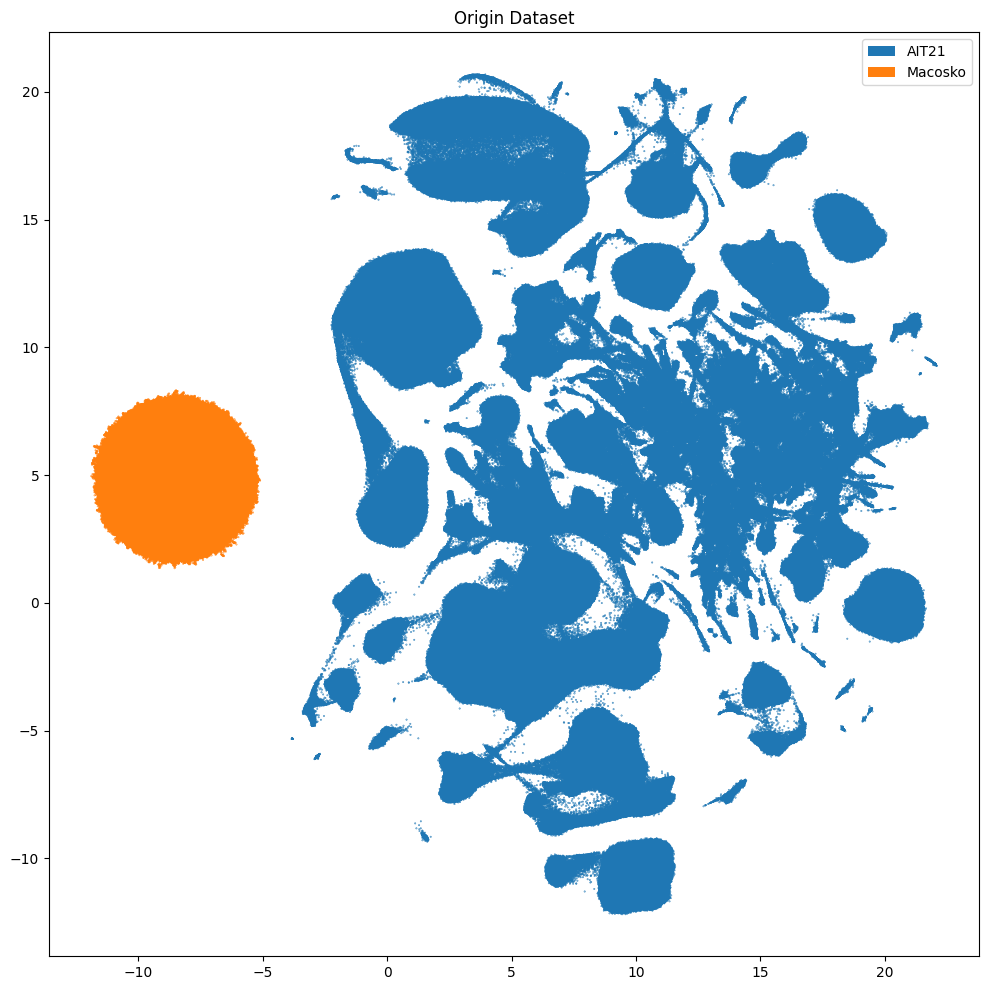

In [29]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['origin_dataset_color'],
    labels=cell_extended['origin_dataset'],
    term_orders=cell_extended['origin_dataset_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Origin Dataset")
plt.show()

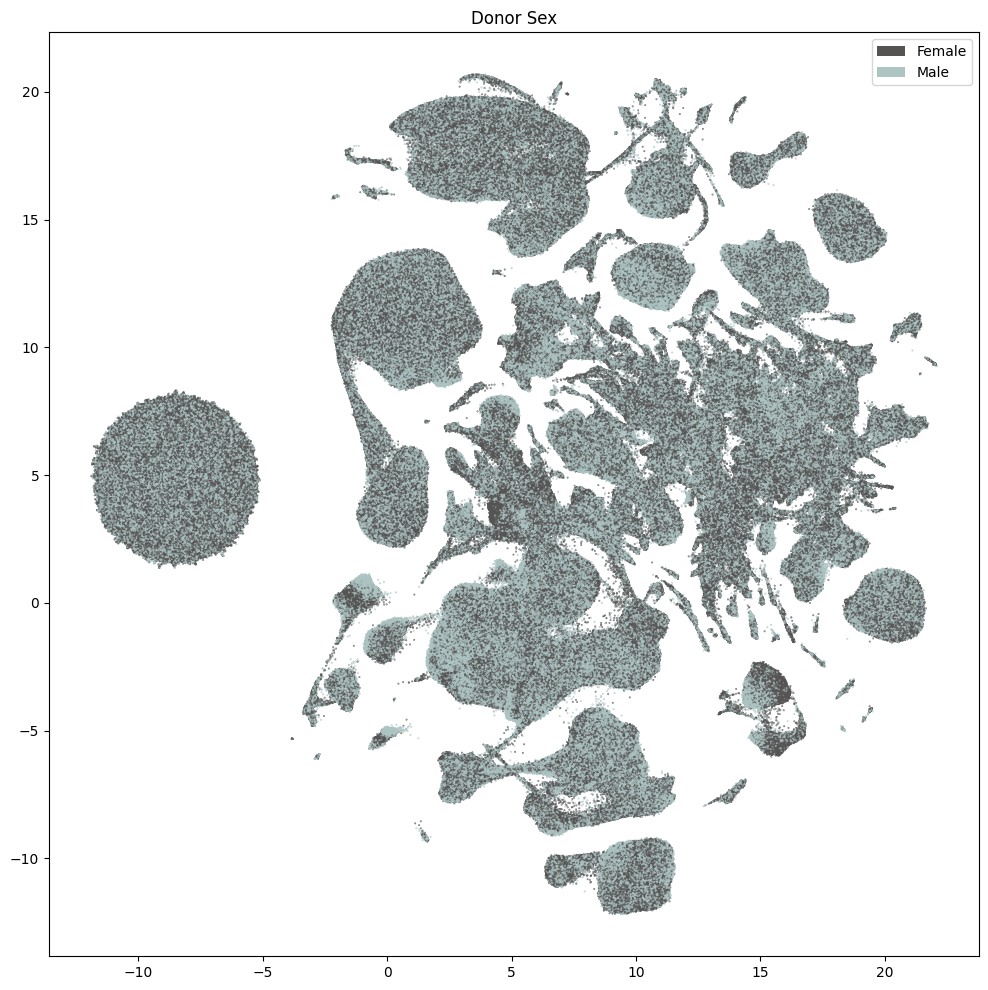

In [30]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['donor_sex_color'],
    labels=cell_extended['donor_sex'],
    term_orders=cell_extended['donor_sex_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Donor Sex")
plt.show()

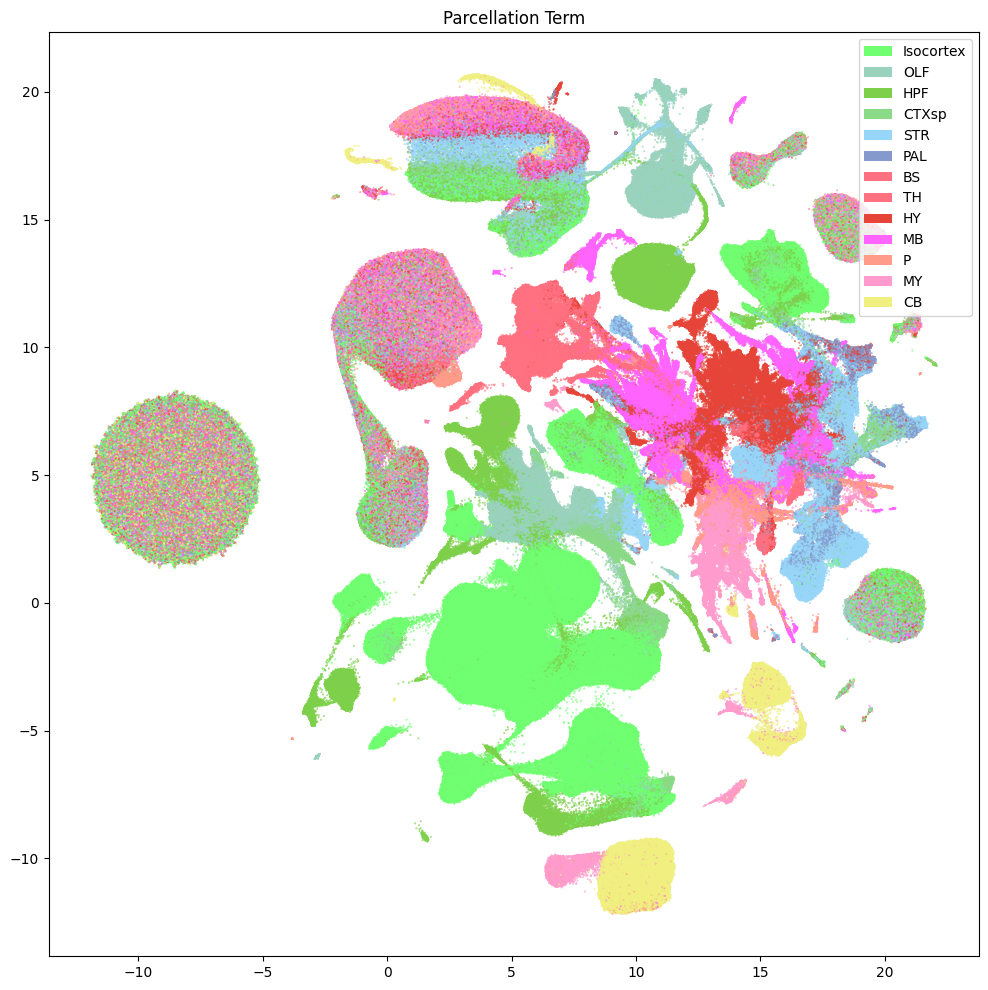

In [31]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['parcellation_term_symbol_color'],
    labels=cell_extended['parcellation_term_symbol'],
    term_orders=cell_extended['parcellation_term_symbol_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("Parcellation Term")
plt.show()

## Taxonomy Information

The final set of metadata we load into our extended cell metadata file maps the cells into their assigned cluster in the taxonomy. We additionally load metadata for the clusters and compute useful information, such as the number of cells in each taxon at each level of the taxonomy.

First, we load information associated with each Cluster in the taxonomy. This includes a useful alias value for each cluster as well as the number of cells in each cluster.

In [32]:
cluster = abc_cache.get_metadata_dataframe('Consensus-Mouse-taxonomy', 'cluster').set_index('label')
cluster.head()

cluster.csv: 100%|██████████| 219k/219k [00:00<00:00, 959kMB/s]  


,cluster_alias,number_of_cells
label,,
CS20251031_CLUST_00058,58,1543
CS20251031_CLUST_00062,62,1900
CS20251031_CLUST_00063,63,1692
CS20251031_CLUST_00065,65,498
CS20251031_CLUST_00068,68,2077


Next, we load the table that describes the levels in the taxonomy from Neighborhood at the highest to Cluster at the lowest level.

In [33]:
cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-taxonomy',
    file_name='cluster_annotation_term_set'
).set_index('label')
cluster_annotation_term_set

cluster_annotation_term_set.csv: 100%|██████████| 271/271 [00:00<00:00, 2.48kMB/s]


,name,description,order
label,,,
PLACEHOLDER_NEUR,neurotransmitter,neurotransmitter,0
PLACEHOLDER_NEIGH,neighborhood,neighborhood,1
PLACEHOLDER_CLAS,class,class,2
PLACEHOLDER_SUBC,subclass,subclass,3
PLACEHOLDER_SUPT,supertype,supertype,4
PLACEHOLDER_CLUST,cluster,cluster,5


For the clusters, we load information on the annotations for each cluster. This also includes the term order and color information which we will use to plot later.

In [34]:
cluster_annotation_term = abc_cache.get_metadata_dataframe('Consensus-Mouse-taxonomy', 'cluster_annotation_term').set_index('label')
cluster_annotation_term.head()

cluster_annotation_term.csv: 100%|██████████| 1.29M/1.29M [00:00<00:00, 3.12MMB/s]


,name,cluster_annotation_term_set_label,cluster_annotation_term_set_name,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label
label,,,,,,,,,
CS20251031_NEUR_0011,Chol,CCN20251031_NEUR,neurotransmitter,#bc5ceb,11,0,NaN,NaN,NaN
CS20251031_NEUR_0008,Dopa,CCN20251031_NEUR,neurotransmitter,#d66a72,8,0,NaN,NaN,NaN
CS20251031_NEUR_0003,Dopa-Gaba,CCN20251031_NEUR,neurotransmitter,#f37a20,3,0,NaN,NaN,NaN
CS20251031_NEUR_0002,Gaba,CCN20251031_NEUR,neurotransmitter,#564830,2,0,NaN,NaN,NaN
CS20251031_NEUR_0005,Gaba-Chol,CCN20251031_NEUR,neurotransmitter,#972650,5,0,NaN,NaN,NaN


Finally, we load the cluster to cluster annotation membership table. Each row in this table is a mapping between the clusters and every level of the taxonomy it belongs to, including the clusters themselves. We'll use this table in a `groupby`s to allow us to count up the number of clusters at each taxonomy level and sum the number of cells in each taxon in the taxonomy a all levels.

In [35]:
cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='Consensus-Mouse-taxonomy',
    file_name='cluster_to_cluster_annotation_membership'
).set_index('cluster_annotation_term_label')
cluster_to_cluster_annotation_membership

cluster_to_cluster_annotation_membership.csv: 100%|██████████| 2.89M/2.89M [00:00<00:00, 5.53MMB/s]


,cluster_annotation_term_set_name,cluster_annotation_term_name,cluster_alias,cluster_annotation_term_set_label
cluster_annotation_term_label,,,,
CS20251031_NEUR_0000,neurotransmitter,Glut,2057,CCN20251031_NEUR
CS20251031_NEUR_0000,neurotransmitter,Glut,2061,CCN20251031_NEUR
CS20251031_NEUR_0000,neurotransmitter,Glut,2071,CCN20251031_NEUR
CS20251031_NEUR_0000,neurotransmitter,Glut,2083,CCN20251031_NEUR
CS20251031_NEUR_0000,neurotransmitter,Glut,2084,CCN20251031_NEUR
...,...,...,...,...
CS20251031_CLUST_6781,cluster,consensus-16107,16107,CCN20251031_CLUST
CS20251031_CLUST_6782,cluster,consensus-13925,13925,CCN20251031_CLUST
CS20251031_CLUST_6783,cluster,consensus-16112,16112,CCN20251031_CLUST


In [36]:
membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)
membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()
membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)
membership_with_cluster_info.head()

,cluster_annotation_term_label,cluster_annotation_term_set_name,cluster_annotation_term_name,cluster_alias,cluster_annotation_term_set_label,number_of_cells,name,cluster_annotation_term_set_label_anno_term,cluster_annotation_term_set_name_anno_term,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label
0,CS20251031_NEUR_0000,neurotransmitter,Glut,2057,CCN20251031_NEUR,15294,Glut,CCN20251031_NEUR,neurotransmitter,#0bcba1,0,0,NaN,NaN,NaN
1,CS20251031_NEUR_0000,neurotransmitter,Glut,2061,CCN20251031_NEUR,12183,Glut,CCN20251031_NEUR,neurotransmitter,#0bcba1,0,0,NaN,NaN,NaN
2,CS20251031_NEUR_0000,neurotransmitter,Glut,2071,CCN20251031_NEUR,309,Glut,CCN20251031_NEUR,neurotransmitter,#0bcba1,0,0,NaN,NaN,NaN
3,CS20251031_NEUR_0000,neurotransmitter,Glut,2083,CCN20251031_NEUR,2625,Glut,CCN20251031_NEUR,neurotransmitter,#0bcba1,0,0,NaN,NaN,NaN
4,CS20251031_NEUR_0000,neurotransmitter,Glut,2084,CCN20251031_NEUR,4784,Glut,CCN20251031_NEUR,neurotransmitter,#0bcba1,0,0,NaN,NaN,NaN


From the membership table, we create three tables via a `groupby`. First the alias of each cluster and its parents.

In [37]:
# term_sets = abc_cache.get_metadata_dataframe(directory='WHB-taxonomy', file_name='cluster_annotation_term_set').set_index('label')
cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_details = cluster_details[cluster_annotation_term_set['name']] # order columns
cluster_details.sort_values(['neighborhood', 'class', 'subclass', 'supertype', 'cluster'], inplace=True)
cluster_details.head()

cluster_annotation_term_set_name,neurotransmitter,neighborhood,class,subclass,supertype,cluster
cluster_alias,,,,,,
5644,Gaba,HY-EA-Glut-GABA,11 CNU-HYa GABA,073 MEA-BST Sox6 Gaba,073 MEA-BST Sox6 Gaba_1,consensus-5644
5651,Gaba,HY-EA-Glut-GABA,11 CNU-HYa GABA,073 MEA-BST Sox6 Gaba,073 MEA-BST Sox6 Gaba_1,consensus-5651
5656,Gaba,HY-EA-Glut-GABA,11 CNU-HYa GABA,073 MEA-BST Sox6 Gaba,073 MEA-BST Sox6 Gaba_1,consensus-5656
5657,Gaba,HY-EA-Glut-GABA,11 CNU-HYa GABA,073 MEA-BST Sox6 Gaba,073 MEA-BST Sox6 Gaba_1,consensus-5657
5659,Gaba,HY-EA-Glut-GABA,11 CNU-HYa GABA,073 MEA-BST Sox6 Gaba,073 MEA-BST Sox6 Gaba_1,consensus-5659


Next the plotting order of each of the clusters and their parents.

In [38]:
cluster_order = membership_groupby['term_order'].first().unstack()
cluster_order.sort_values(['neighborhood', 'class', 'subclass', 'supertype', 'cluster'], inplace=True)
cluster_order.head()

cluster_annotation_term_set_name,class,cluster,neighborhood,neurotransmitter,subclass,supertype
cluster_alias,,,,,,
2057,0,0,0,0,0,0
2061,0,1,0,0,0,0
2071,0,2,0,0,0,0
2083,0,3,0,0,0,0
2084,0,4,0,0,0,0


Finally, the colors we will use to plot for each of the unique taxons at all levels.

In [39]:
cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]
cluster_colors.sort_values(
    ['neighborhood', 'class', 'subclass', 'supertype', 'cluster'],
    inplace=True
)
cluster_colors.head()

cluster_annotation_term_set_name,neurotransmitter,neighborhood,class,subclass,supertype,cluster
cluster_alias,,,,,,
6425,#0bcba1,#02e436,#01d669,#66662E,#180278,#662500
6439,#0bcba1,#02e436,#01d669,#66662E,#180278,#889945
6436,#0bcba1,#02e436,#01d669,#66662E,#180278,#CC3DB3
6432,#0bcba1,#02e436,#01d669,#66662E,#6d5de8,#8BDCDC
6429,#0bcba1,#02e436,#01d669,#66662E,#c957ed,#7ACCCC


Next, we bring it all together by loading the mapping of cells to cluster and join into our final metadata table.

In [40]:
cell_to_cluster_membership = abc_cache.get_metadata_dataframe('Consensus-Mouse-taxonomy', 'cell_to_cluster_membership').set_index('cell_label')
cell_to_cluster_membership.head()

cell_to_cluster_membership.csv: 100%|██████████| 311M/311M [00:54<00:00, 5.69MMB/s]    


,cluster_alias
cell_label,
CAGGTGCAGGCTAGCA-040_C01,5491
CGGACGTGTGTGAATA-063_B01,6268
GATCCCTTCGTGCACG-107_B01,6659
TCACGAACAACTGCGC-026_A01,6672
ACACCAAGTCAAACTC-026_B01,7067


We merge this table with information from our clusters.

In [41]:
cell_extended = cell_extended.join(cell_to_cluster_membership, rsuffix='_cell_to_cluster_membership', how='inner')
cell_extended = cell_extended.join(cluster_details, on='cluster_alias')
cell_extended = cell_extended.join(cluster_colors, on='cluster_alias', rsuffix='_color')
cell_extended = cell_extended.join(cluster_order, on='cluster_alias', rsuffix='_order')

del cell_to_cluster_membership

cell_extended.head()

,cell_barcode,barcoded_cell_sample_label,library_label,dataset_label,feature_matrix_label,library_method,alignment_id,region_of_interest_acronym,parcellation_term_symbol,donor_label,...,class_color,subclass_color,supertype_color,cluster_color,class_order,cluster_order,neighborhood_order,neurotransmitter_order,subclass_order,supertype_order
cell_label,,,,,,,,,,,,,,,,,,,,,
pBICCNsMMrAUDiM015d210707A4_ACGGTTACATCGGAAG,ACGGTTACATCGGAAG,NaN,pBICCNsMMrAUDiM015d210707A4,Consensus-Mouse-Macosko-10X,Macosko-10X-Isocortex,NaN,NaN,AUD,Isocortex,M015,...,#03045E,#FF26CB,#5735ad,#5C997B,36,6655,7,14,407,1711
pBICCNsMMrMBM1iF012d201007_GAGTCTAAGAGTTGTA,GAGTCTAAGAGTTGTA,NaN,pBICCNsMMrMBM1iF012d201007,Consensus-Mouse-Macosko-10X,Macosko-10X-MB,NaN,NaN,MB,MB,F012,...,#007200,#6C1799,#ca6206,#34D682,19,3794,3,0,205,993
GAAGAATAGGGACTGT-394_C06,GAAGAATAGGGACTGT,394_C06,L8TX_201016_01_H04,WMB-10Xv3,WMB-10Xv3-STR,10Xv3,1177903216,STRv,STR,Snap25-IRES2-Cre;Ai14-546811,...,#594a26,#3DCCB1,#2a098a,#551799,33,6603,7,14,400,1693
pBICCNsMMrMBL4BiF010d200825_CCATAAGAGGTTCATC,CCATAAGAGGTTCATC,NaN,pBICCNsMMrMBL4BiF010d200825,Consensus-Mouse-Macosko-10X,Macosko-10X-MB,NaN,NaN,MB,MB,F010,...,#594a26,#AD5CCC,#0d8273,#2C00FF,33,6568,7,14,399,1682
pBICCNsMMrCBPFiM001d190107a_GCGATCGAGTCACAGG,GCGATCGAGTCACAGG,NaN,pBICCNsMMrCBPFiM001d190107a,Consensus-Mouse-Macosko-10X,Macosko-10X-CB,NaN,NaN,CB,CB,M001,...,#858881,#CC5CC1,#f689d9,#00C6CC,38,6694,7,14,410,1723


In [42]:
print_column_info(cell_extended)

Number of unique cell_barcode = 3580247 
Number of unique barcoded_cell_sample_label = 781 
Number of unique library_label = 1434 
Number of unique dataset_label = 3 ['Consensus-Mouse-Macosko-10X', 'WMB-10Xv2', 'WMB-10Xv3']
Number of unique feature_matrix_label = 33 
Number of unique library_method = 2 ['10Xv2', '10Xv3']
Number of unique alignment_id = 781 
Number of unique region_of_interest_acronym = 42 
Number of unique parcellation_term_symbol = 13 ['BS', 'CB', 'CTXsp', 'HPF', 'HY', 'Isocortex', 'MB', 'MY', 'OLF', 'P', 'PAL', 'STR', 'TH']
Number of unique donor_label = 373 
Number of unique donor_sex = 2 ['Female', 'Male']
Number of unique donor_age = 22 ['51 days', '52 days', '53 days', '54 days', '55 days', '56 days', '57 days', '58 days', '59 days', '60 days', '61 days', '62 days', '63 days', '64 days', '65 days', '66 days', '67 days', '68 days', '69 days', '70 days', '71 days', 'unknown']
Number of unique origin_dataset = 2 ['AIT21', 'Macosko']
Number of unique origin_dataset_c

#### Plotting the taxonomy

Now that we have our cells with associated taxonomy information, we'll plot them into the UMAP we showed previously.

Below we plot the taxonomy mapping of the cells for each level in the taxonomy.

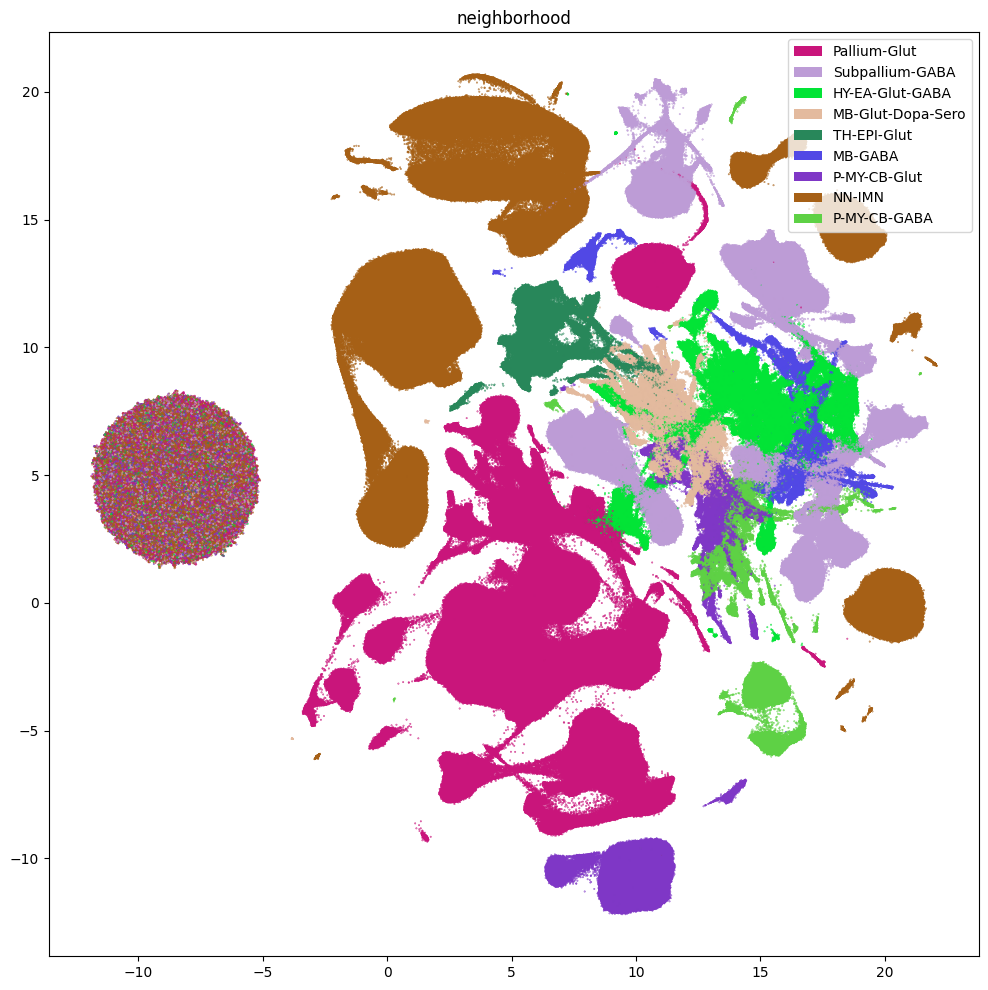

In [43]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['neighborhood_color'],
    labels=cell_extended['neighborhood'],
    term_orders=cell_extended['neighborhood_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("neighborhood")
plt.show()

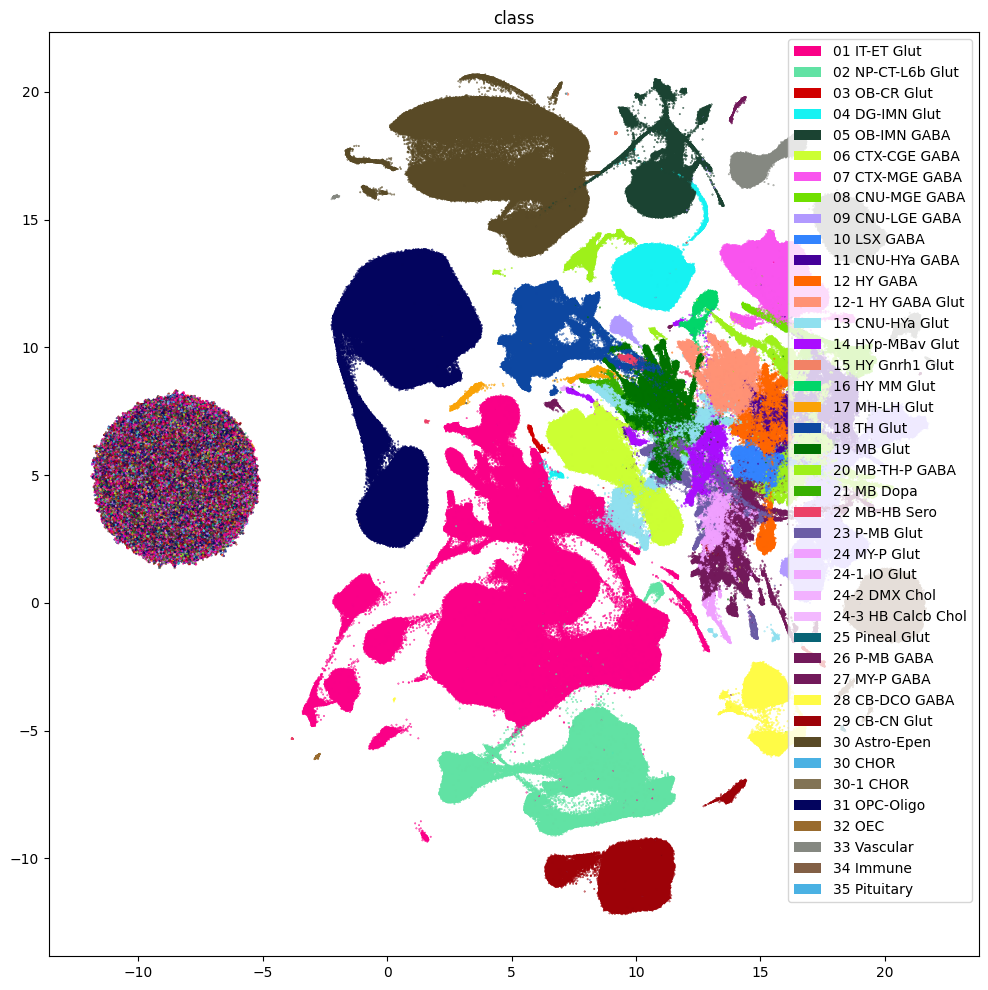

In [44]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['class_color'],
    labels=cell_extended['class'],
    term_orders=cell_extended['class_order'],
    fig_width=12,
    fig_height=12
)
res = ax.set_title("class")
plt.show()

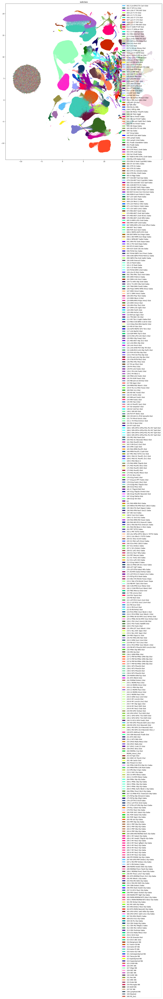

In [45]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['subclass_color'],
    labels=cell_extended['subclass'],
    term_orders=cell_extended['subclass_order'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("subclass")
plt.show()

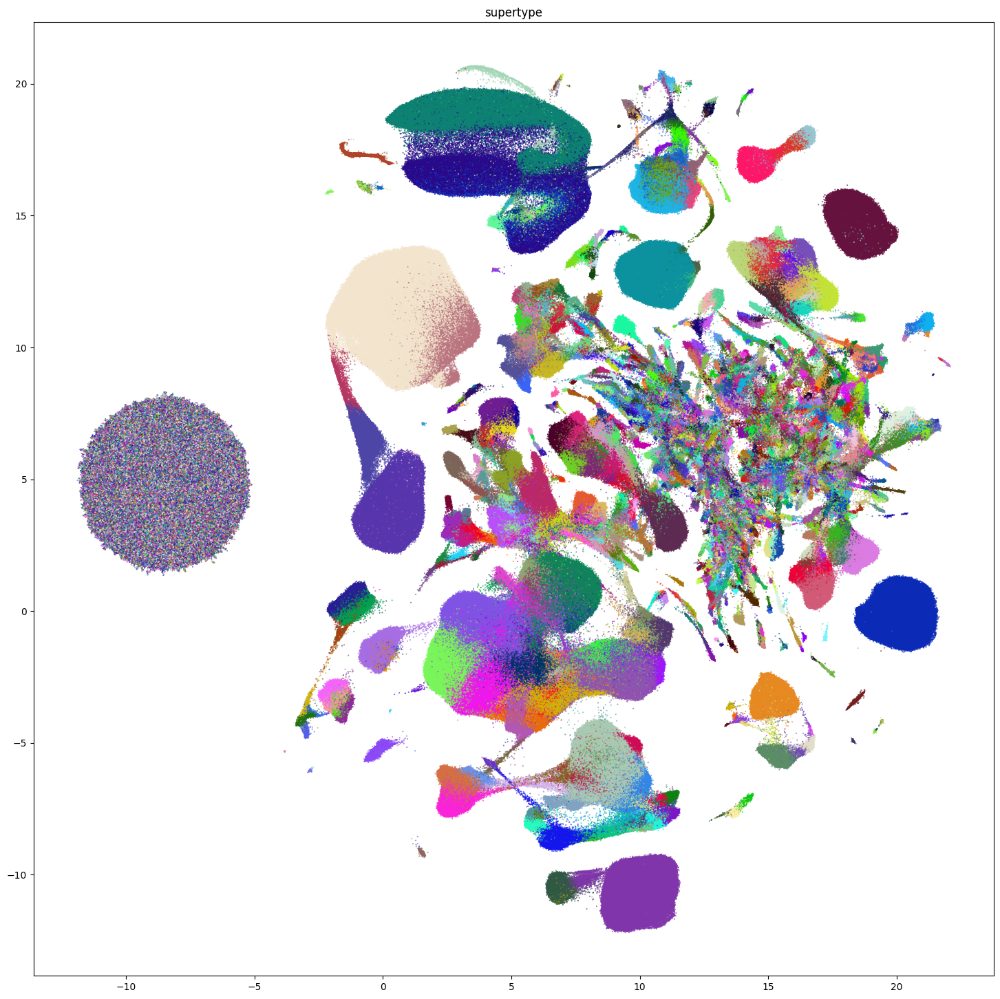

In [46]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['supertype_color'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("supertype")
plt.show()

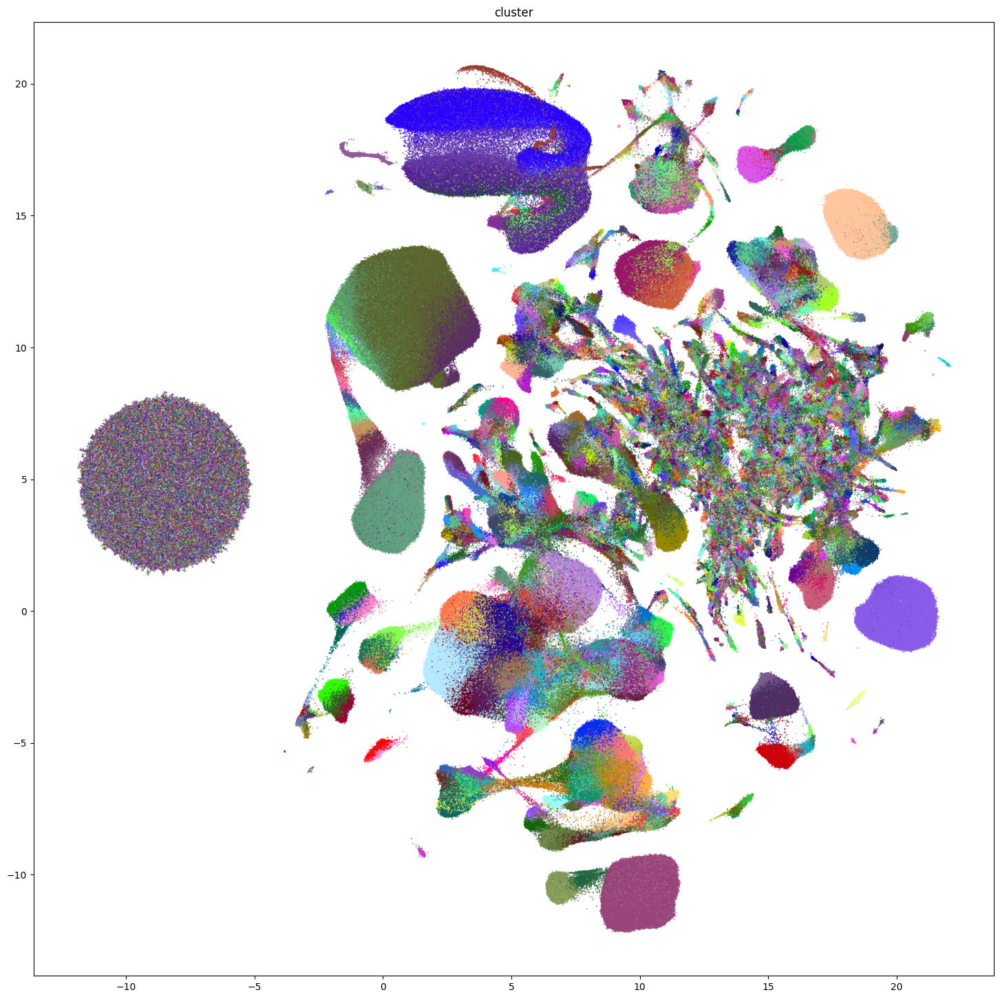

In [47]:
fig, ax = plot_umap(
    cell_extended['x'],
    cell_extended['y'],
    cc=cell_extended['cluster_color'],
    fig_width=18,
    fig_height=18
)
res = ax.set_title("cluster")
plt.show()

### Aggregating cluster and cells counts.

Let's investigate the taxonomy information a bit more. In this section, we'll create bar plots showing the number of clusters and cells at each level in the taxonomy.

First, we need to compute the number of clusters that are in each of the cell type taxons above it.

In [48]:
term_cluster_count = membership_with_cluster_info.reset_index().groupby(
        ['cluster_annotation_term_label']
    )[['cluster_alias']].count()
term_cluster_count.columns = ['number_of_clusters']
term_cluster_count

,number_of_clusters
cluster_annotation_term_label,
CS20251031_CLAS_0000,541
CS20251031_CLAS_0001,103
CS20251031_CLAS_0002,27
CS20251031_CLAS_0003,26
CS20251031_CLAS_0004,167
...,...
CS20251031_SUPT_1752,1
CS20251031_SUPT_1753,2
CS20251031_SUPT_1754,1


Next we sum the cells that are associated for each level in the taxonomy.

In [49]:
term_cell_count = membership_with_cluster_info.reset_index().groupby(
    ['cluster_annotation_term_label']
)[['number_of_cells']].sum()
term_cell_count

,number_of_cells
cluster_annotation_term_label,
CS20251031_CLAS_0000,1630864
CS20251031_CLAS_0001,388987
CS20251031_CLAS_0002,17445
CS20251031_CLAS_0003,142595
CS20251031_CLAS_0004,218309
...,...
CS20251031_SUPT_1752,30
CS20251031_SUPT_1753,341
CS20251031_SUPT_1754,425


In [50]:
# Join counts with the term dataframe
term_with_counts = cluster_annotation_term.join(term_cluster_count)
term_with_counts = term_with_counts.join(term_cell_count)
term_with_counts

,name,cluster_annotation_term_set_label,cluster_annotation_term_set_name,color_hex_triplet,term_order,term_set_order,parent_term_label,parent_term_name,parent_term_set_label,number_of_clusters,number_of_cells
label,,,,,,,,,,,
CS20251031_NEUR_0011,Chol,CCN20251031_NEUR,neurotransmitter,#bc5ceb,11,0,NaN,NaN,NaN,31,3832
CS20251031_NEUR_0008,Dopa,CCN20251031_NEUR,neurotransmitter,#d66a72,8,0,NaN,NaN,NaN,45,10908
CS20251031_NEUR_0003,Dopa-Gaba,CCN20251031_NEUR,neurotransmitter,#f37a20,3,0,NaN,NaN,NaN,15,11608
CS20251031_NEUR_0002,Gaba,CCN20251031_NEUR,neurotransmitter,#564830,2,0,NaN,NaN,NaN,2377,1295507
CS20251031_NEUR_0005,Gaba-Chol,CCN20251031_NEUR,neurotransmitter,#972650,5,0,NaN,NaN,NaN,16,2467
...,...,...,...,...,...,...,...,...,...,...,...
CS20251031_CLUST_6418,consensus-9991,CCN20251031_CLUST,cluster,#99DDFF,6418,5,CS20251031_SUPT_1636,305 SPVI-SPVC Sall3 Nfib Gly-Gaba_8,CCN20251031_SUPT,1,92
CS20251031_CLUST_6412,consensus-9992,CCN20251031_CLUST,cluster,#6E1D1B,6412,5,CS20251031_SUPT_1634,305 SPVI-SPVC Sall3 Nfib Gly-Gaba_6,CCN20251031_SUPT,1,50
CS20251031_CLUST_6481,consensus-9997,CCN20251031_CLUST,cluster,#663C2E,6481,5,CS20251031_SUPT_1650,308 DCO Il22 Gly-Gaba_1,CCN20251031_SUPT,1,360


Below we create a function to plot the cluster and cell counts in a bar graph, coloring by the associated taxon level.

In [51]:
def bar_plot_by_level_and_type(df: pd.DataFrame, level: str, fig_width: float = 8.5, fig_height: float = 8.5):
    """Plot the number of cells by the specified level.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing cluster annotation terms with counts.
    level : str
        The level of the taxonomy to plot (e.g., 'Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster').
    fig_width : float, optional
        Width of the figure in inches. Default is 8.5.
    fig_height : float, optional
        Height of the figure in inches. Default is 4.
    """

    fig, ax = plt.subplots(1, 2)
    fig.set_size_inches(fig_width, fig_height)

    for idx, ctype in enumerate(['clusters', 'cells']):

        pred = (df['cluster_annotation_term_set_name'] == level)
        sort_order = np.argsort(df[pred]['term_order'])
        names = df[pred]['name'].iloc[sort_order]
        counts = df[pred]['number_of_%s' % ctype].iloc[sort_order]
        colors = df[pred]['color_hex_triplet'].iloc[sort_order]
        
        ax[idx].barh(names[::-1], counts[::-1], color=colors[::-1])
        ax[idx].set_title('Number of %s by %s' % (ctype,level))
        ax[idx].set_xlabel('Number of %s' % ctype)
        if ctype == 'cells':
            ax[idx].set_xscale('log')
        
        if idx > 0:
            ax[idx].set_yticklabels([])

    return fig, ax

Now, we plot bar graphs of the number of clusters and cells by taxonomy level. Below we show neighborhood and class, but this comparison can be made for all levels in the taxonomy. 

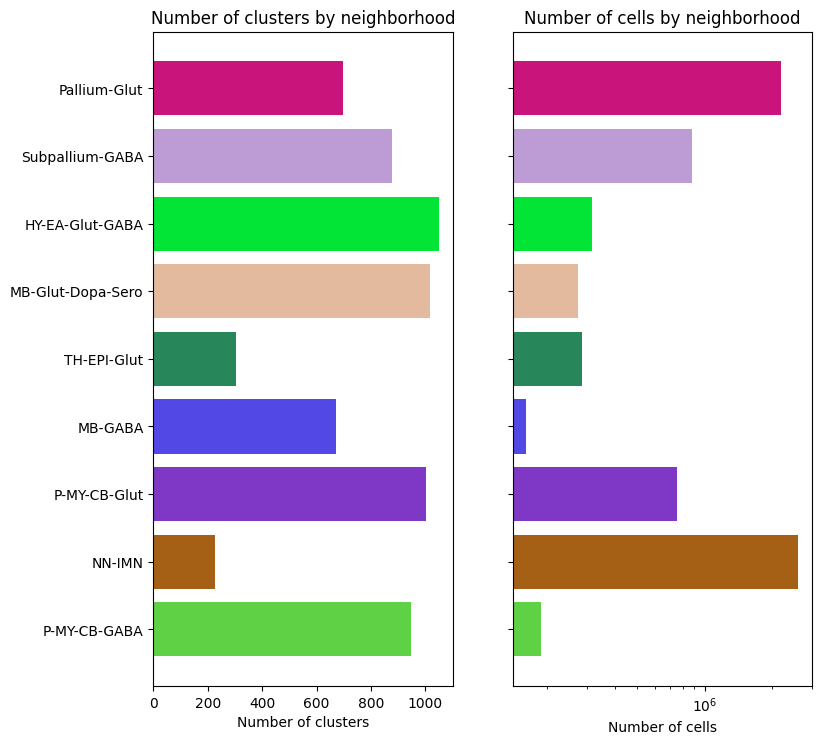

In [52]:
fig, ax = bar_plot_by_level_and_type(term_with_counts, 'neighborhood')
plt.show()

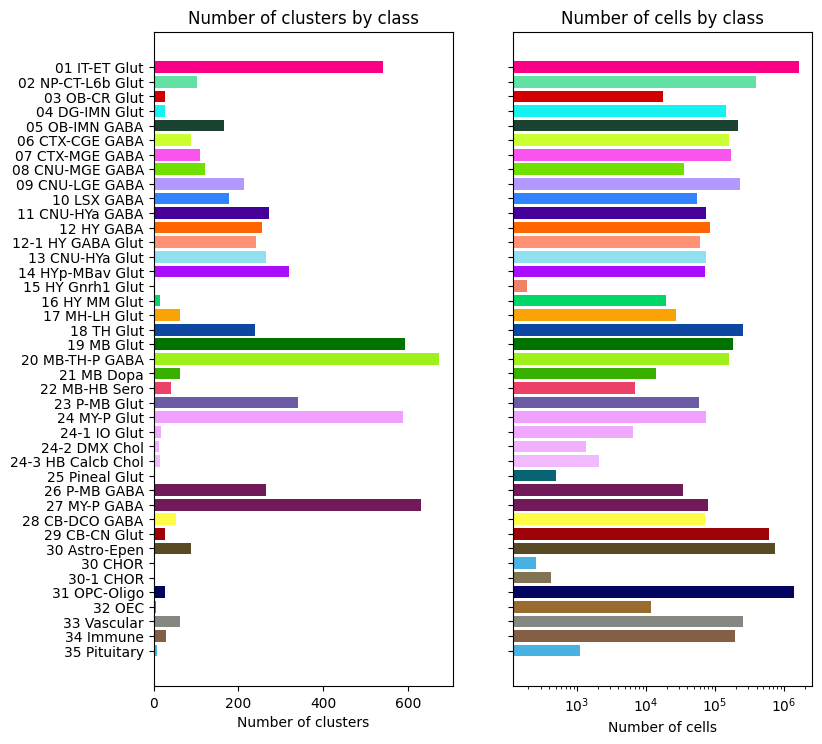

In [53]:
fig, ax = bar_plot_by_level_and_type(term_with_counts, 'class')
plt.show()

### Visualizing the  taxonomy

Pie chart for Neighborhood, Class, Subclass, and Supertype with width's given by the number of clusters in each.

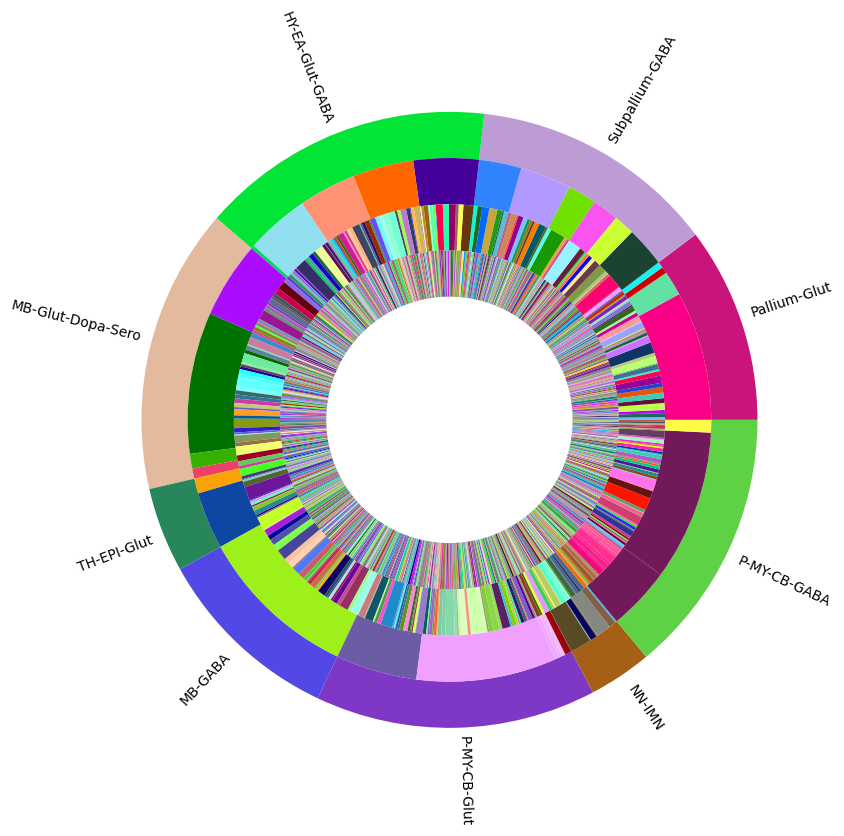

In [54]:
levels = ['neighborhood', 'class', 'subclass', 'supertype']
df = {}

# Copy the term order of the parent into each of the level below it.
term_with_counts['parent_order'] = ""
for idx, row in term_with_counts.iterrows():
    if pd.isna(row['parent_term_label']):
        continue
    term_with_counts.loc[idx, 'parent_order'] = term_with_counts.loc[row['parent_term_label']]['term_order']

term_with_counts = term_with_counts.reset_index()
for lvl in levels:
    pred = term_with_counts['cluster_annotation_term_set_name'] == lvl
    df[lvl] = term_with_counts[pred]
    df[lvl] = df[lvl].sort_values(['parent_order', 'term_order'])

fig, ax = plt.subplots()
fig.set_size_inches(10, 10)
size = 0.15

for i, lvl in enumerate(levels):
    
    if lvl == 'neighborhood':
        ax.pie(df[lvl]['number_of_clusters'],
               colors=df[lvl]['color_hex_triplet'],
               labels = df[lvl]['name'],
               rotatelabels=True,
               labeldistance=1.025,
               radius=1,
               wedgeprops=dict(width=size, edgecolor=None),
               startangle=0)
    else :
        ax.pie(df[lvl]['number_of_clusters'],
               colors=df[lvl]['color_hex_triplet'],
               radius=1-i*size,
               wedgeprops=dict(width=size, edgecolor=None),
               startangle=0)
term_with_counts = term_with_counts.set_index('label')
plt.show()

In the [next notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/consensus_mouse_10X_snRNASeq.html), we'll explore the gene expression data and combine them with the taxonomy and cell level metadata. You can also explore the previously released Whole Mouse Brain (WMB) through the notebooks linked [here](https://alleninstitute.github.io/abc_atlas_access/descriptions/notebook_subtitle1.html).